# 3D Path Reconstruction Interpolation for Visualising Trajectories.

### Authors: Harnoor Dhingra, Brett Nelson (NSDS Lab, LBNL)

#### Input files: 3D reconstructed file in suitable format as shown.

In [74]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import cm
from matplotlib import pyplot
import matplotlib.pyplot as plt 
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation
from sys import exit
from scipy import interpolate
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

In [75]:
input_df = pd.read_csv('Kin_11_RM13.csv')

In [76]:
input_df.head()

,bodyparts,Handle,Handle.1,Handle.2,B Handle,B Handle.1,B Handle.2,Nose,Nose.1,Nose.2,...,Third Base 2.2,Third tip 2,Third tip 2.1,Third tip 2.2,Fourth Base 2,Fourth Base 2.1,Fourth Base 2.2,Fourth tip 2,Fourth tip 2.1,Fourth tip 2.2
0,coords,X,Y,Z,X,Y,Z,X,Y,Z,...,Z,X,Y,Z,X,Y,Z,X,Y,Z
1,0,-0.009040454151160239,-0.019483533552768665,0.025478754502539485,0.027668118355450293,0.053811200605276714,0.0459031741108265,0.05970254834954528,0.04749145542902452,0.049250397114220267,...,0.05614329023570517,0.08753533095003328,0.03919929105118608,-0.000320999646611841,0.04453208560458315,0.050123913550073576,0.0952570631986719,0.08147827839486772,0.0524438588268942,0.08686935405763903
2,1,0.005257171514260717,-0.005345606927738875,-0.030779389693114428,0.028262759262751087,0.032211788767158925,0.024682484359751816,0.01402106737200328,0.010866725512041368,0.0026394401325512606,...,0.005300394571875877,0.008251229304598848,0.011550655905221394,0.013676364552721048,0.023654990976236714,0.020883748849013967,0.007929454929133684,0.010487322578159361,0.004419791659521201,0.003316367601806477
3,2,0.0052568152178848635,-0.006903705076092949,-0.030791150997353994,0.05005582200112366,0.05490366169776032,0.0396564647441805,0.029421745733480848,0.01631796964131583,0.0026652658991612424,...,0.0020297400550934627,0.008273188184822861,0.011842000479277597,0.013709536882843142,0.02367681990379813,0.02092834532651522,0.007947481544820797,0.012223038582615534,0.004425653896226596,0.0033411688300256366
4,3,0.005251246696629076,-0.006055997501254872,-0.030735671519301584,0.04983186350586189,0.05492448732278572,0.03963077673722342,0.029406704625490655,0.01629459801962825,0.002679244026181354,...,-0.0866669859957705,0.00830971945667588,0.011630406845402183,0.014135508283730074,0.023779848435818308,0.02098920472436546,0.007866661821557416,-0.05253525041284653,0.004297219384084766,0.003500315513037238


In [77]:
input_df = input_df.drop(['bodyparts'], axis = 1)
input_df = input_df[1:]
input_df.head()

,Handle,Handle.1,Handle.2,B Handle,B Handle.1,B Handle.2,Nose,Nose.1,Nose.2,Shoulder 1,...,Third Base 2.2,Third tip 2,Third tip 2.1,Third tip 2.2,Fourth Base 2,Fourth Base 2.1,Fourth Base 2.2,Fourth tip 2,Fourth tip 2.1,Fourth tip 2.2
1,-0.009040454151160239,-0.019483533552768665,0.025478754502539485,0.027668118355450293,0.053811200605276714,0.0459031741108265,0.05970254834954528,0.04749145542902452,0.049250397114220267,0.045320299799639564,...,0.05614329023570517,0.08753533095003328,0.03919929105118608,-0.000320999646611841,0.04453208560458315,0.050123913550073576,0.0952570631986719,0.08147827839486772,0.0524438588268942,0.08686935405763903
2,0.005257171514260717,-0.005345606927738875,-0.030779389693114428,0.028262759262751087,0.032211788767158925,0.024682484359751816,0.01402106737200328,0.010866725512041368,0.0026394401325512606,0.009013877582897022,...,0.005300394571875877,0.008251229304598848,0.011550655905221394,0.013676364552721048,0.023654990976236714,0.020883748849013967,0.007929454929133684,0.010487322578159361,0.004419791659521201,0.003316367601806477
3,0.0052568152178848635,-0.006903705076092949,-0.030791150997353994,0.05005582200112366,0.05490366169776032,0.0396564647441805,0.029421745733480848,0.01631796964131583,0.0026652658991612424,-0.003263904567175302,...,0.0020297400550934627,0.008273188184822861,0.011842000479277597,0.013709536882843142,0.02367681990379813,0.02092834532651522,0.007947481544820797,0.012223038582615534,0.004425653896226596,0.0033411688300256366
4,0.005251246696629076,-0.006055997501254872,-0.030735671519301584,0.04983186350586189,0.05492448732278572,0.03963077673722342,0.029406704625490655,0.01629459801962825,0.002679244026181354,-0.0032660071502159907,...,-0.0866669859957705,0.00830971945667588,0.011630406845402183,0.014135508283730074,0.023779848435818308,0.02098920472436546,0.007866661821557416,-0.05253525041284653,0.004297219384084766,0.003500315513037238
5,0.005261091553335173,0.0033282915600957455,-0.03068386959030732,0.049667618185831604,0.0549469638340466,0.03963865985416333,0.029380815884788337,0.016214185609110292,0.0027355686860419536,-0.0032733585493004477,...,0.003024221190540488,0.008320916403652092,0.011770920488730127,0.016580338999208445,0.02407671068832805,0.02125283834844583,0.00985603452260486,0.0064499987324665095,0.004304893690533364,0.005043628562073721


In [78]:
input_df = input_df.astype(float).round(4)
input_df.head()

,Handle,Handle.1,Handle.2,B Handle,B Handle.1,B Handle.2,Nose,Nose.1,Nose.2,Shoulder 1,...,Third Base 2.2,Third tip 2,Third tip 2.1,Third tip 2.2,Fourth Base 2,Fourth Base 2.1,Fourth Base 2.2,Fourth tip 2,Fourth tip 2.1,Fourth tip 2.2
1,-0.0090,-0.0195,0.0255,0.0277,0.0538,0.0459,0.0597,0.0475,0.0493,0.0453,...,0.0561,0.0875,0.0392,-0.0003,0.0445,0.0501,0.0953,0.0815,0.0524,0.0869
2,0.0053,-0.0053,-0.0308,0.0283,0.0322,0.0247,0.0140,0.0109,0.0026,0.0090,...,0.0053,0.0083,0.0116,0.0137,0.0237,0.0209,0.0079,0.0105,0.0044,0.0033
3,0.0053,-0.0069,-0.0308,0.0501,0.0549,0.0397,0.0294,0.0163,0.0027,-0.0033,...,0.0020,0.0083,0.0118,0.0137,0.0237,0.0209,0.0079,0.0122,0.0044,0.0033
4,0.0053,-0.0061,-0.0307,0.0498,0.0549,0.0396,0.0294,0.0163,0.0027,-0.0033,...,-0.0867,0.0083,0.0116,0.0141,0.0238,0.0210,0.0079,-0.0525,0.0043,0.0035
5,0.0053,0.0033,-0.0307,0.0497,0.0549,0.0396,0.0294,0.0162,0.0027,-0.0033,...,0.0030,0.0083,0.0118,0.0166,0.0241,0.0213,0.0099,0.0064,0.0043,0.0050


In [79]:
x1, y1, z1 = input_df["Handle"][100:200], input_df["Handle.1"][100:200], input_df["Handle.2"][100:200]
x2, y2, z2 = input_df["B Handle"][100:200], input_df["B Handle.1"][100:200], input_df["B Handle.2"][100:200]
x3, y3, z3 = input_df["Nose"][100:200], input_df["Nose.1"][100:200], input_df["Nose.2"][100:200]
x4, y4, z4 = input_df["Shoulder 1"][100:200], input_df["Shoulder 1.1"][100:200], input_df["Shoulder 1.2"][100:200]
x5, y5, z5 = input_df["Forearm 1"][100:200], input_df["Forearm 1.1"][100:200], input_df["Forearm 1.2"][100:200]
# x6, y6, z6 = input_df["Wrist 1"][100:200], input_df["Wrist 1.1"][100:200], input_df["Wrist 1.2"][100:200]
x6, y6, z6 = input_df["Palm 1"][100:200], input_df["Palm 1.1"][100:200], input_df["Palm 1.2"][100:200]
x7, y7, z7 = input_df["Shoulder 2"][100:200], input_df["Shoulder 2.1"][100:200], input_df["Shoulder 2.2"][100:200]
x8, y8, z8 = input_df["Forearm 2"][100:200], input_df["Forearm 2.1"][100:200], input_df["Forearm 2.2"][100:200]
# x10, y10, z10 = input_df["Wrist 1"][100:200], input_df["Wrist 1.1"][100:200], input_df["Wrist 1.2"][100:200]
x9, y9, z9 = input_df["Palm 2"][100:200], input_df["Palm 2.1"][100:200], input_df["Palm 2.2"][100:200]

In [80]:
x1 = np.array(x1)
y1 = np.array(y1)
z1 = np.array(z1)

x2 = np.array(x2)
y2 = np.array(y2)
z2 = np.array(z2)

x3 = np.array(x3)
y3 = np.array(y3)
z3 = np.array(z3)

x4 = np.array(x4)
y4 = np.array(y4)
z4 = np.array(z4)

x5 = np.array(x5)
y5 = np.array(y5)
z5 = np.array(z5)

x6 = np.array(x6)
y6 = np.array(y6)
z6 = np.array(z6)

x7 = np.array(x7)
y7 = np.array(y7)
z7 = np.array(z7)

x8 = np.array(x8)
y8 = np.array(y8)
z8 = np.array(z8)

x9 = np.array(x9)
y9 = np.array(y9)
z9 = np.array(z9)

In [81]:
okay = np.where(np.abs(np.diff(x1)) + np.abs(np.diff(y1)) + np.abs(np.diff(z1))  > 0)
x1 = np.r_[x1[okay], x1[-1], x1[0]]
y1 = np.r_[y1[okay], y1[-1], y1[0]]
z1 = np.r_[z1[okay], z1[-1], z1[0]]

In [82]:
okay = np.where(np.abs(np.diff(x8)) + np.abs(np.diff(y8)) + np.abs(np.diff(z8))  > 0)
x8 = np.r_[x8[okay], x8[-1], x8[0]]
y8 = np.r_[y8[okay], y8[-1], y8[0]]
z8 = np.r_[z8[okay], z8[-1], z8[0]]

In [83]:
tck, u = interpolate.splprep([x1, y1, z1], k =5)
x_knots1, y_knots1, z_knots1 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine1, y_fine1, z_fine1 = interpolate.splev(u_fine, tck)

In [84]:
tck, u = interpolate.splprep([x2, y2, z2], k =5)
x_knots2, y_knots2, z_knots2 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine2, y_fine2, z_fine2 = interpolate.splev(u_fine, tck)

In [85]:
tck, u = interpolate.splprep([x3, y3, z3], k =5)
x_knots3, y_knots3, z_knots3 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine3, y_fine3, z_fine3 = interpolate.splev(u_fine, tck)

In [86]:
tck, u = interpolate.splprep([x4, y4, z4], k =5)
x_knots4, y_knots4, z_knots4 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine4, y_fine4, z_fine4 = interpolate.splev(u_fine, tck)

In [87]:
tck, u = interpolate.splprep([x5, y5, z5], k =5)
x_knots5, y_knots5, z_knots5 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine5, y_fine5, z_fine5 = interpolate.splev(u_fine, tck)

In [88]:
tck, u = interpolate.splprep([x6, y6, z6], k =5)
x_knots6, y_knots6, z_knots6 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine6, y_fine6, z_fine6 = interpolate.splev(u_fine, tck)

In [89]:
tck, u = interpolate.splprep([x7, y7, z7], k =5)
x_knots7, y_knots7, z_knots7 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine7, y_fine7, z_fine7 = interpolate.splev(u_fine, tck)

In [90]:
tck, u = interpolate.splprep([x8, y8, z8], k =5)
x_knots8, y_knots8, z_knots8 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine8, y_fine8, z_fine8 = interpolate.splev(u_fine, tck)

In [91]:
tck, u = interpolate.splprep([x9, y9, z9], k =5)
x_knots9, y_knots9, z_knots9 = interpolate.splev(u, tck)
u_fine = np.linspace(0.1,1,100)
x_fine9, y_fine9, z_fine9 = interpolate.splev(u_fine, tck)

<IPython.core.display.Javascript object>


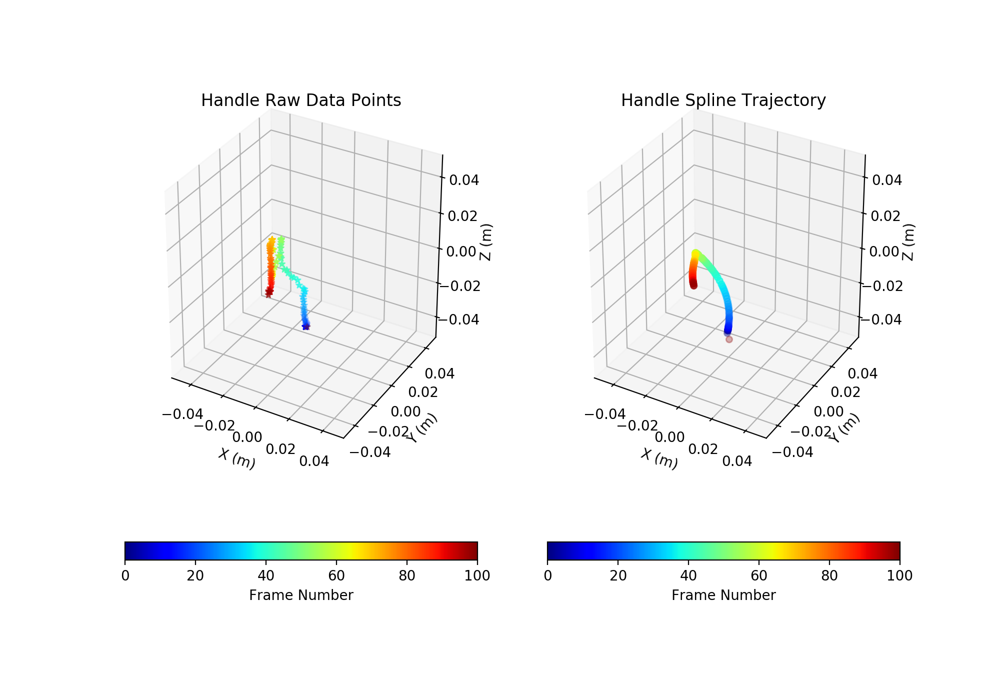

In [107]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig1 = pyplot.figure()
fig1.set_figheight(7)
fig1.set_figwidth(10)

ax = fig1.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Raw Data Points')

p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig1.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig1.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots1, y_knots1, z_knots1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig1.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


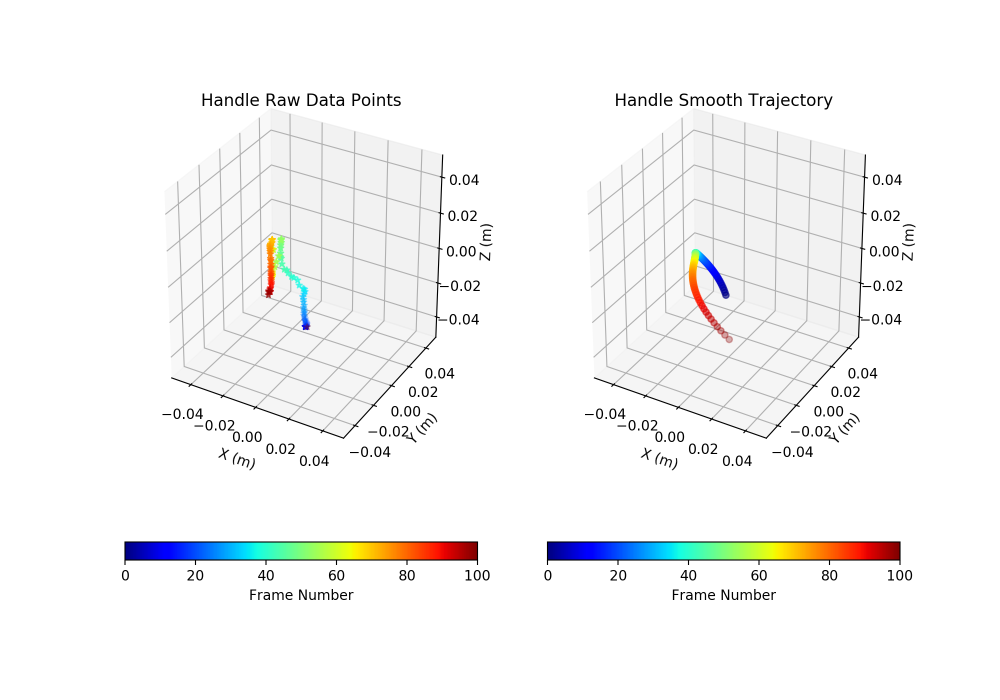

In [108]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig1 = pyplot.figure()
fig1.set_figheight(7)
fig1.set_figwidth(10)

ax = fig1.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Raw Data Points')

p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig1.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig1.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine1, y_fine1, z_fine1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig1.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


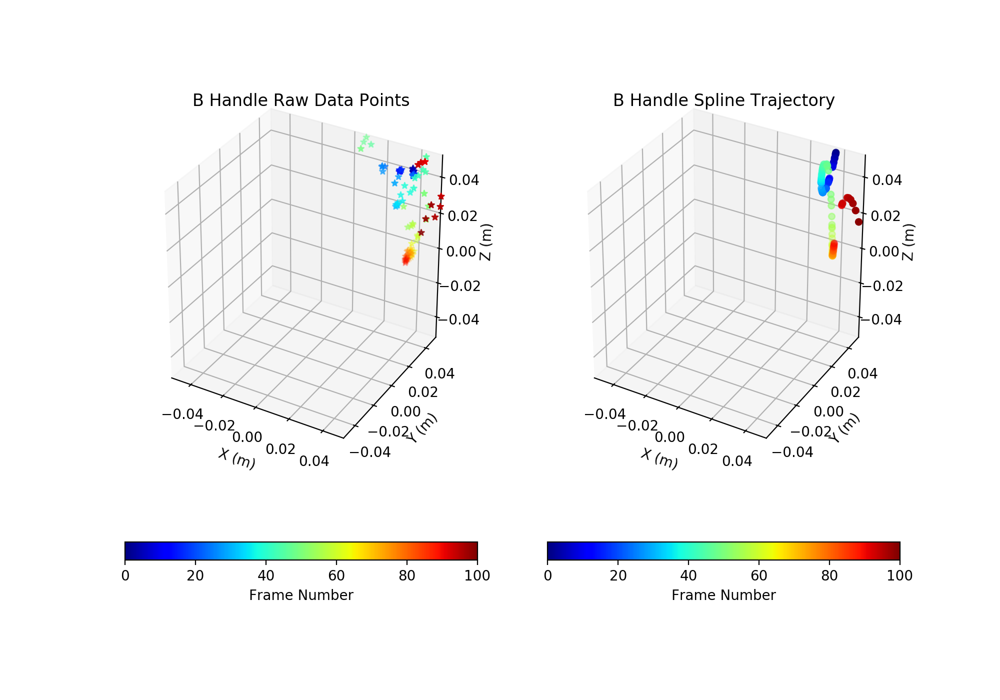

In [109]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig2 = pyplot.figure()
fig2.set_figheight(7)
fig2.set_figwidth(10)

ax = fig2.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('B Handle Raw Data Points')

p = ax.scatter(x2, y2, z2, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig2.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig2.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots2, y_knots2, z_knots2, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig2.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('B Handle Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


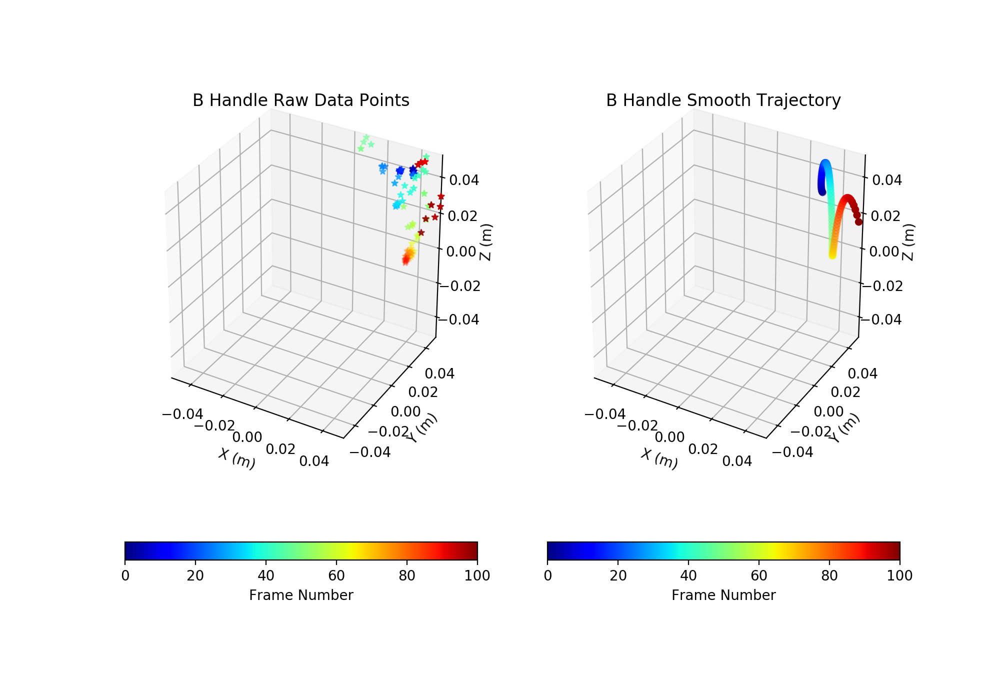

In [110]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig2 = pyplot.figure()
fig2.set_figheight(7)
fig2.set_figwidth(10)

ax = fig2.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('B Handle Raw Data Points')

p = ax.scatter(x2, y2, z2, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig2.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig2.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine2, y_fine2, z_fine2, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig2.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('B Handle Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


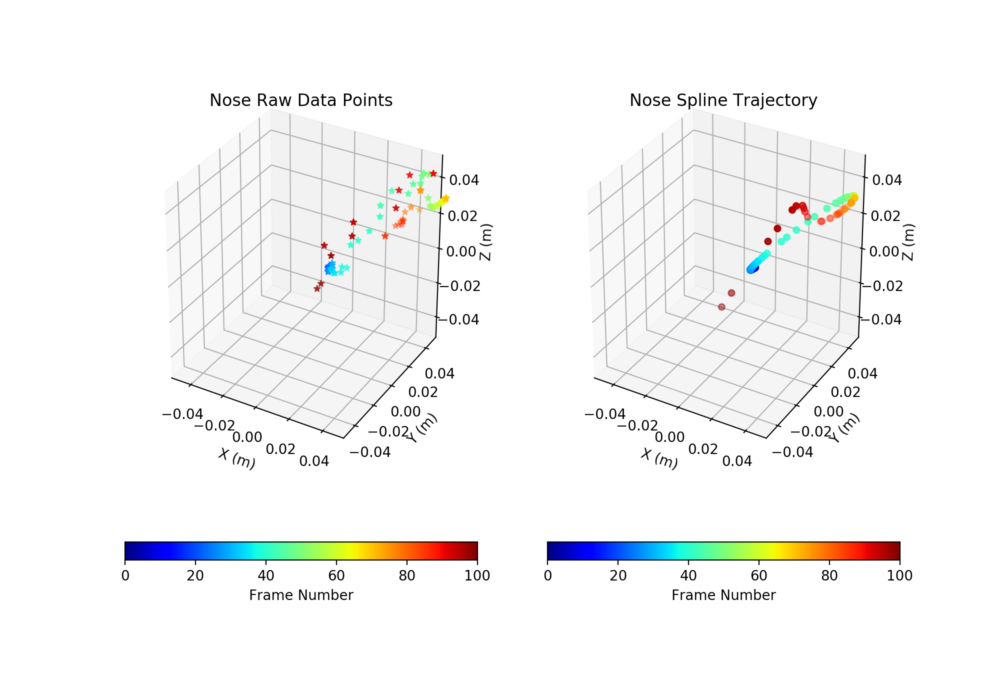

In [111]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig3 = pyplot.figure()
fig3.set_figheight(7)
fig3.set_figwidth(10)

ax = fig3.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Nose Raw Data Points')

p = ax.scatter(x3, y3, z3, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig3.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig3.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots3, y_knots3, z_knots3, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig3.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Nose Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


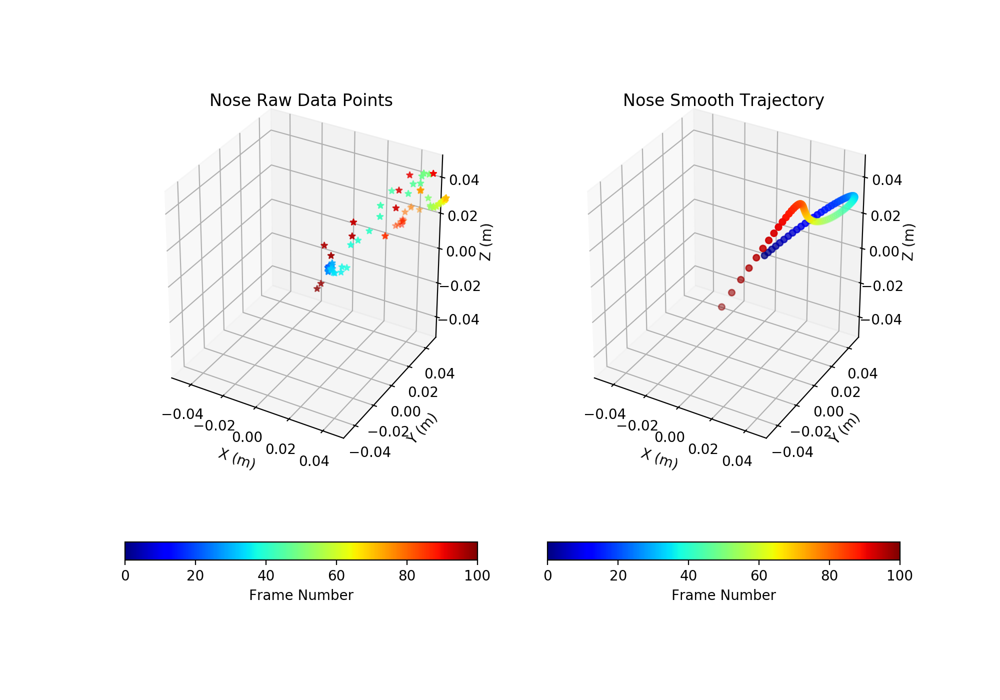

In [112]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig3 = pyplot.figure()
fig3.set_figheight(7)
fig3.set_figwidth(10)

ax = fig3.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Nose Raw Data Points')

p = ax.scatter(x3, y3, z3, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig3.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig3.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine3, y_fine3, z_fine3, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig3.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Nose Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


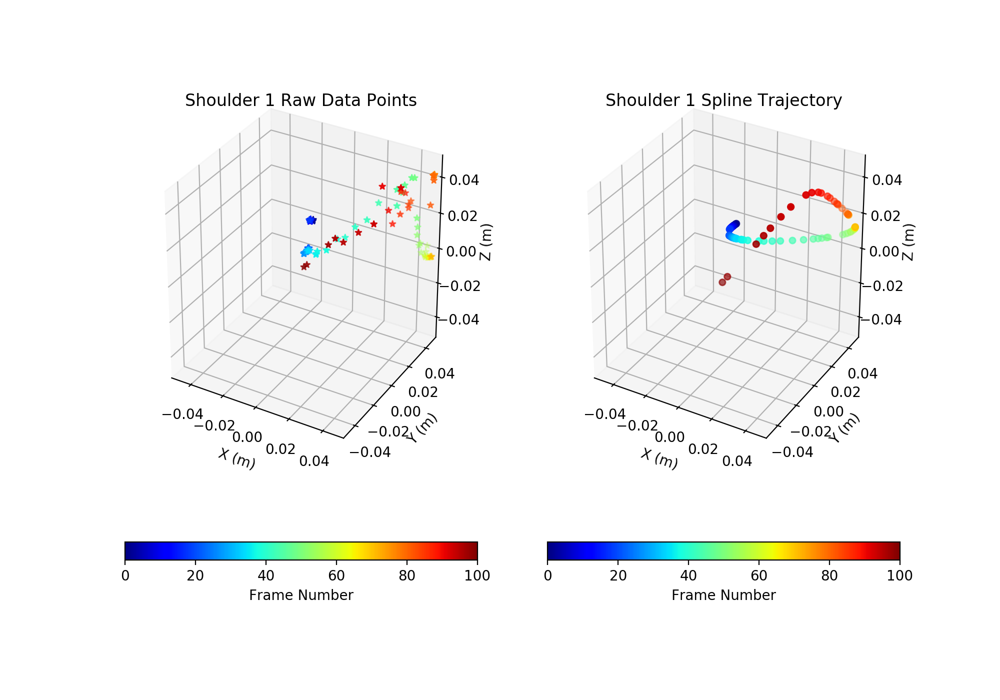

In [113]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig4 = pyplot.figure()
fig4.set_figheight(7)
fig4.set_figwidth(10)

ax = fig4.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 1 Raw Data Points')

p = ax.scatter(x4, y4, z4, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig4.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig4.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots4, y_knots4, z_knots4, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig4.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 1 Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


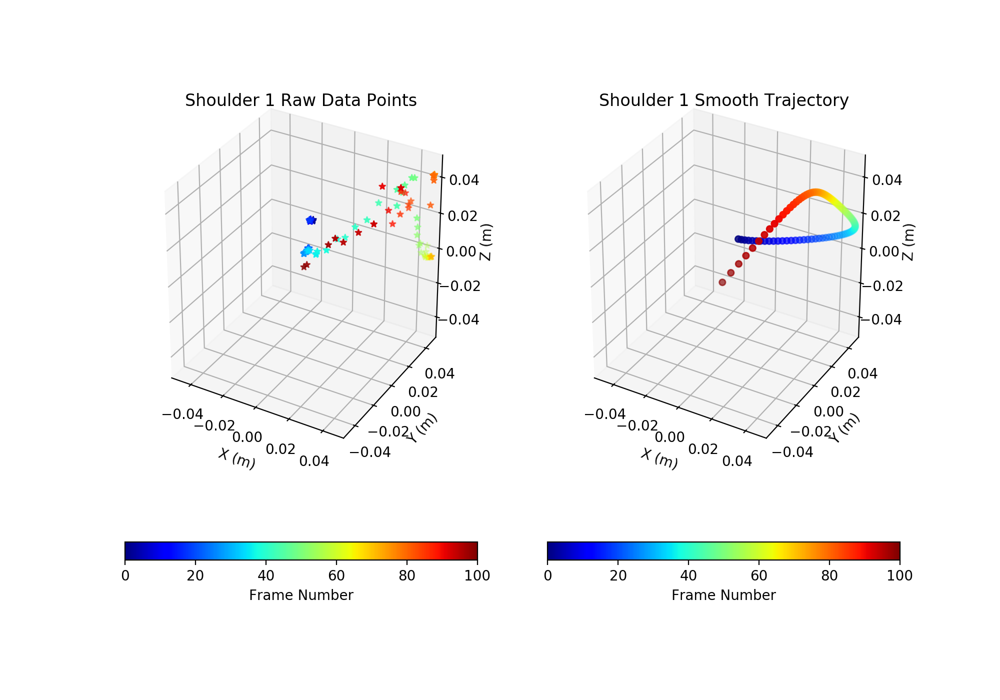

In [114]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig4 = pyplot.figure()
fig4.set_figheight(7)
fig4.set_figwidth(10)

ax = fig4.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 1 Raw Data Points')

p = ax.scatter(x4, y4, z4, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig4.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig4.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine4, y_fine4, z_fine4, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig4.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 1 Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


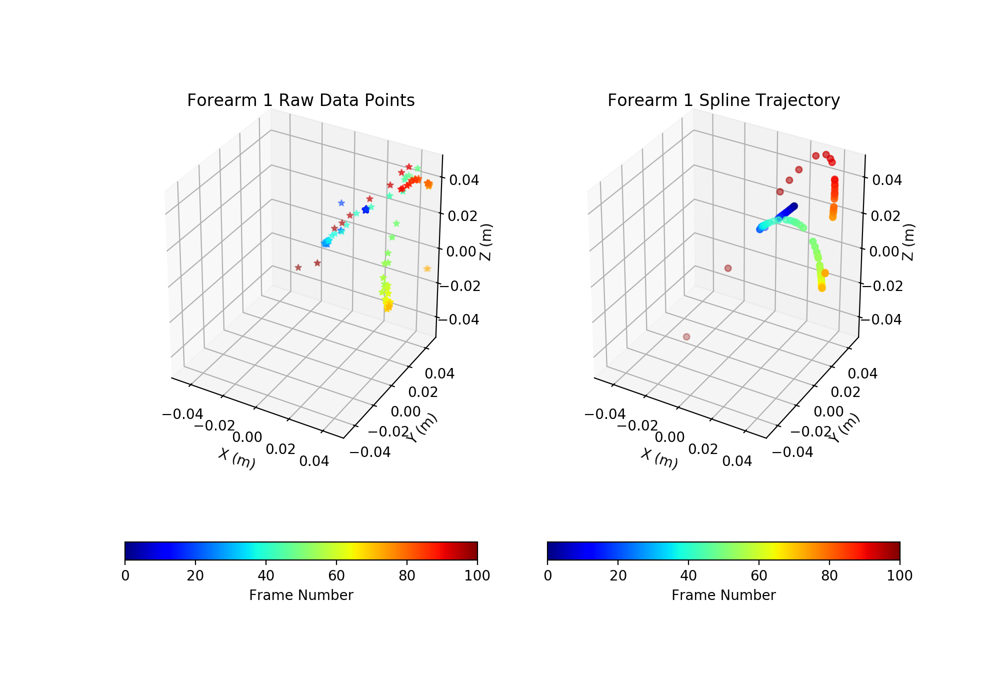

In [115]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig5 = pyplot.figure()
fig5.set_figheight(7)
fig5.set_figwidth(10)

ax = fig5.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Forearm 1 Raw Data Points')

p = ax.scatter(x5, y5, z5, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig5.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig5.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots5, y_knots5, z_knots5, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig5.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Forearm 1 Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


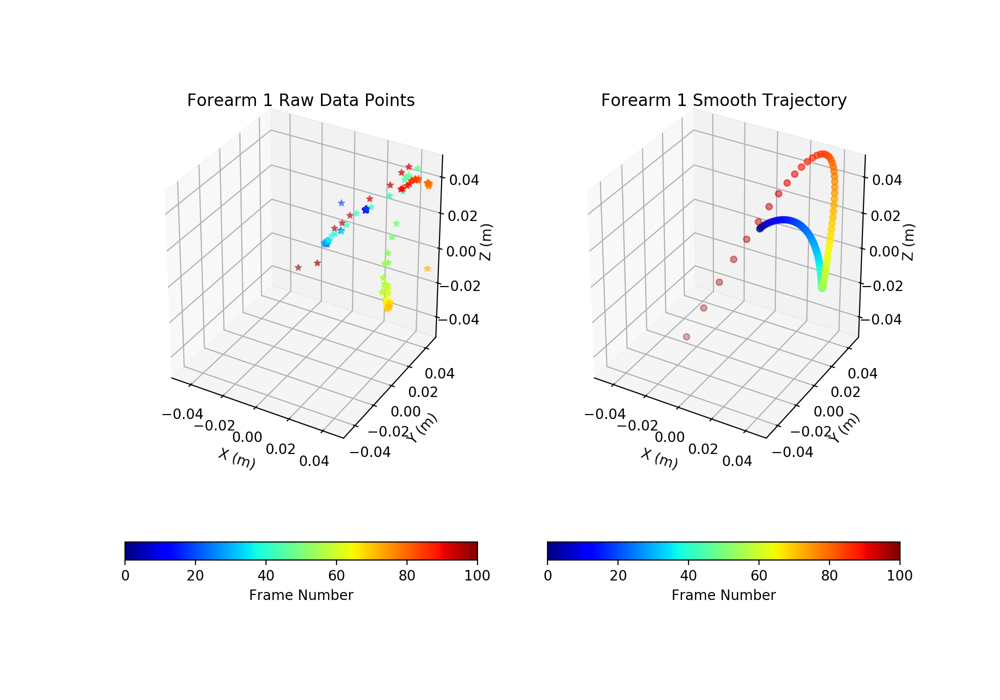

In [116]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig5 = pyplot.figure()
fig5.set_figheight(7)
fig5.set_figwidth(10)

ax = fig5.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Forearm 1 Raw Data Points')

p = ax.scatter(x5, y5, z5, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig5.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig5.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine5, y_fine5, z_fine5, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig5.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Forearm 1 Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


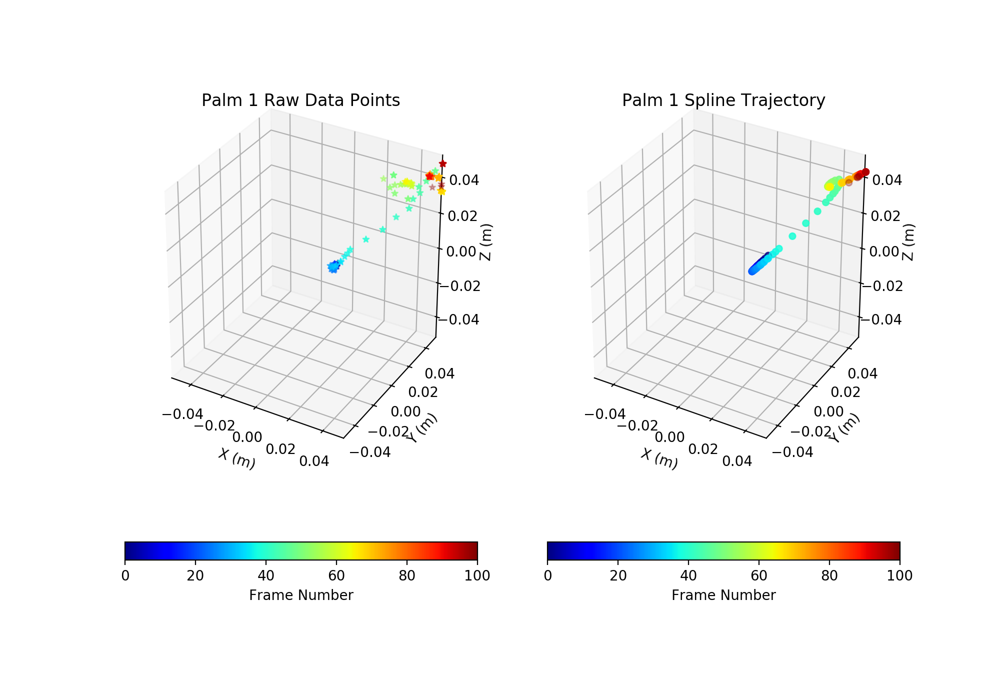

In [117]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig6 = pyplot.figure()
fig6.set_figheight(7)
fig6.set_figwidth(10)

ax = fig6.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 1 Raw Data Points')

p = ax.scatter(x6, y6, z6, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig6.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig6.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots6, y_knots6, z_knots6, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig6.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 1 Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


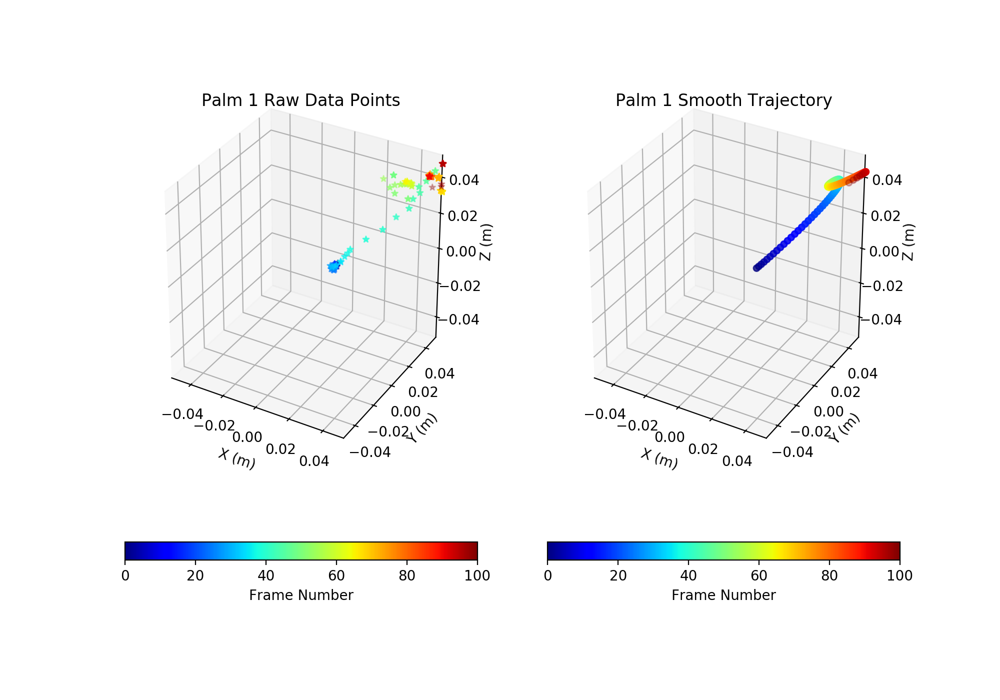

In [118]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig6 = pyplot.figure()
fig6.set_figheight(7)
fig6.set_figwidth(10)

ax = fig6.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 1 Raw Data Points')

p = ax.scatter(x6, y6, z6, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig6.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig6.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine6, y_fine6, z_fine6, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig6.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 1 Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


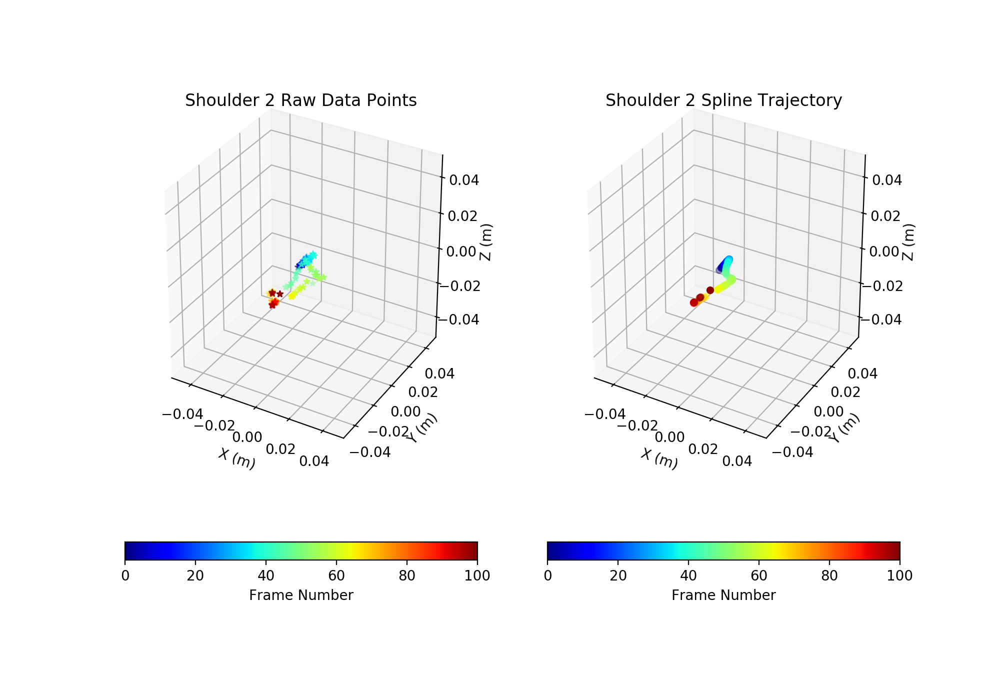

In [119]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig7 = pyplot.figure()
fig7.set_figheight(7)
fig7.set_figwidth(10)

ax = fig7.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 2 Raw Data Points')

p = ax.scatter(x7, y7, z7, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig7.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig7.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots7, y_knots7, z_knots7, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig7.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 2 Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


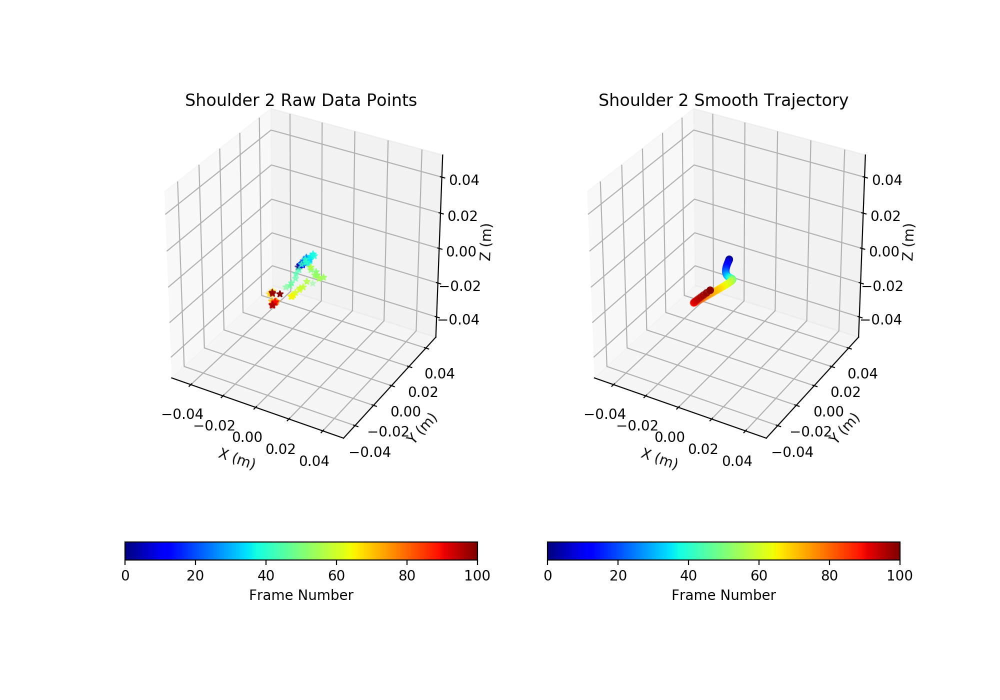

In [120]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig7 = pyplot.figure()
fig7.set_figheight(7)
fig7.set_figwidth(10)

ax = fig7.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 2 Raw Data Points')

p = ax.scatter(x7, y7, z7, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig7.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig7.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine7, y_fine7, z_fine7, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig7.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder 2 Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


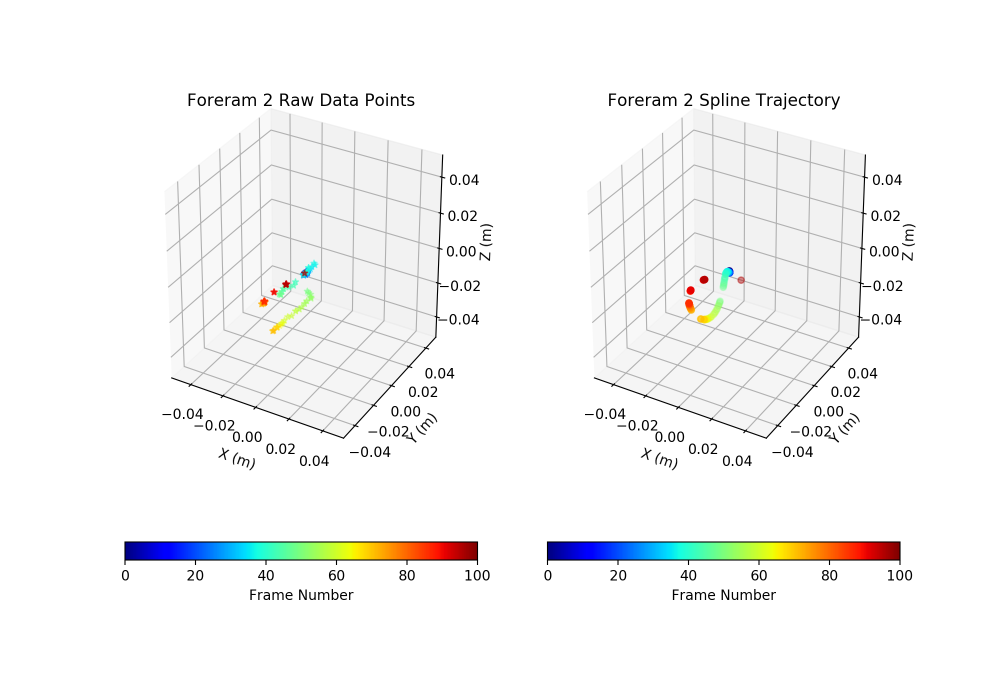

In [123]:
fig8 = pyplot.figure()
fig8.set_figheight(7)
fig8.set_figwidth(10)

ax = fig8.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Foreram 2 Raw Data Points')

cm = plt.cm.get_cmap('jet')
c = range(len(y8))
p = ax.scatter(x8, y8, z8, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig8.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

cm = plt.cm.get_cmap('jet')
c = range(len(y8))
ax = fig8.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots8, y_knots8, z_knots8, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig8.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Foreram 2 Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


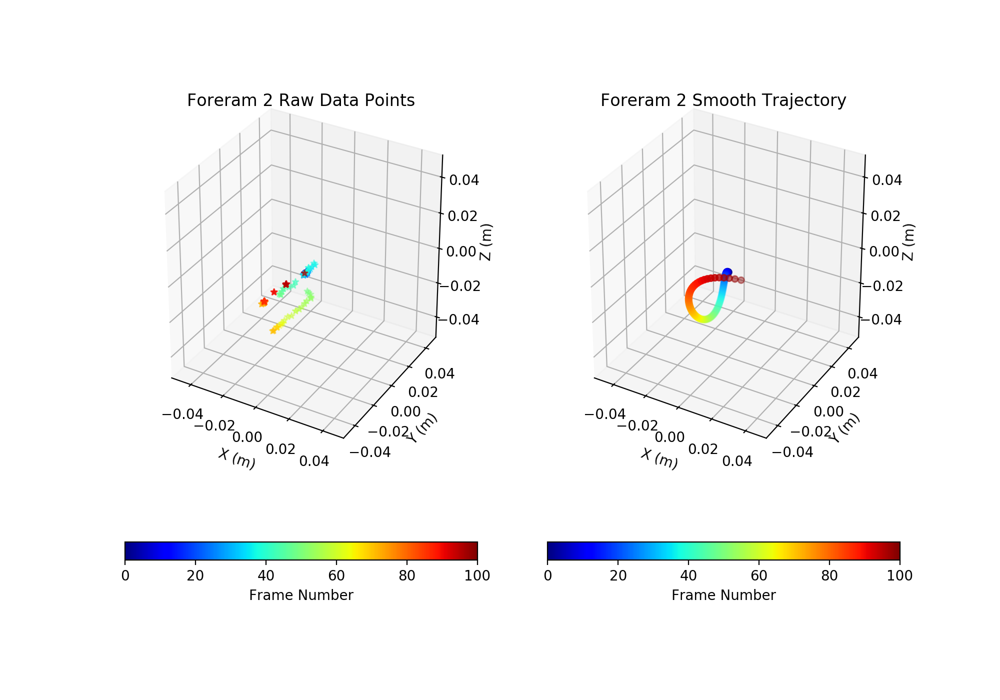

In [124]:
fig8 = pyplot.figure()
fig8.set_figheight(7)
fig8.set_figwidth(10)

ax = fig8.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Foreram 2 Raw Data Points')

cm = plt.cm.get_cmap('jet')
c = range(len(y8))
p = ax.scatter(x8, y8, z8, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig8.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

cm = plt.cm.get_cmap('jet')
c = range(len(y1))
ax = fig8.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine8, y_fine8, z_fine8, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig8.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Foreram 2 Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


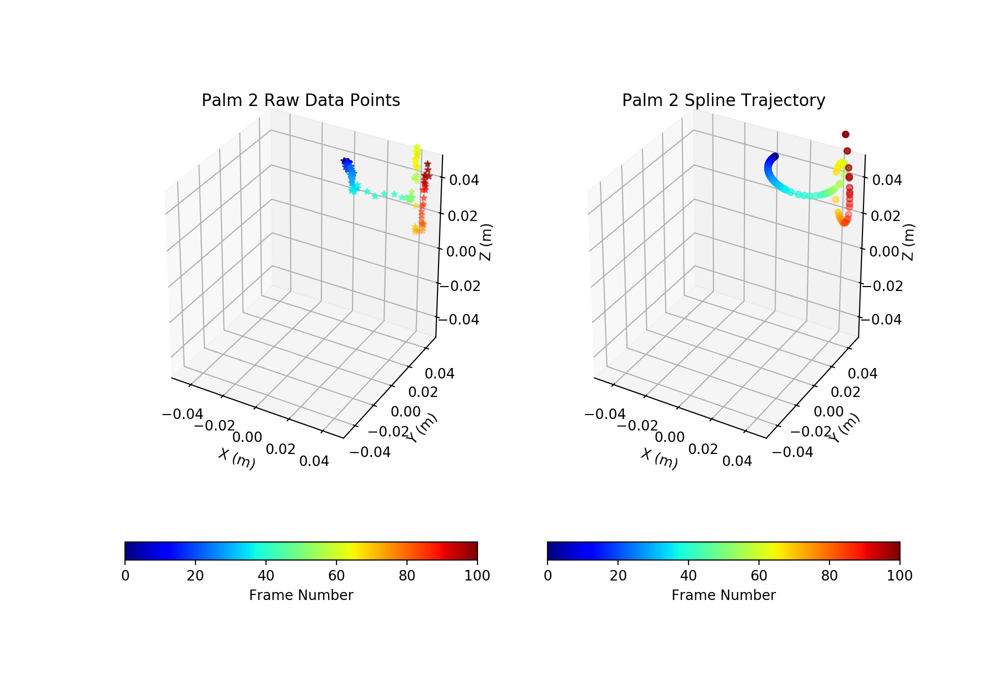

In [125]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig9 = pyplot.figure()
fig9.set_figheight(7)
fig9.set_figwidth(10)

ax = fig9.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 2 Raw Data Points')

p = ax.scatter(x9, y9, z9, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig9.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig9.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_knots9, y_knots9, z_knots9, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig9.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 2 Spline Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


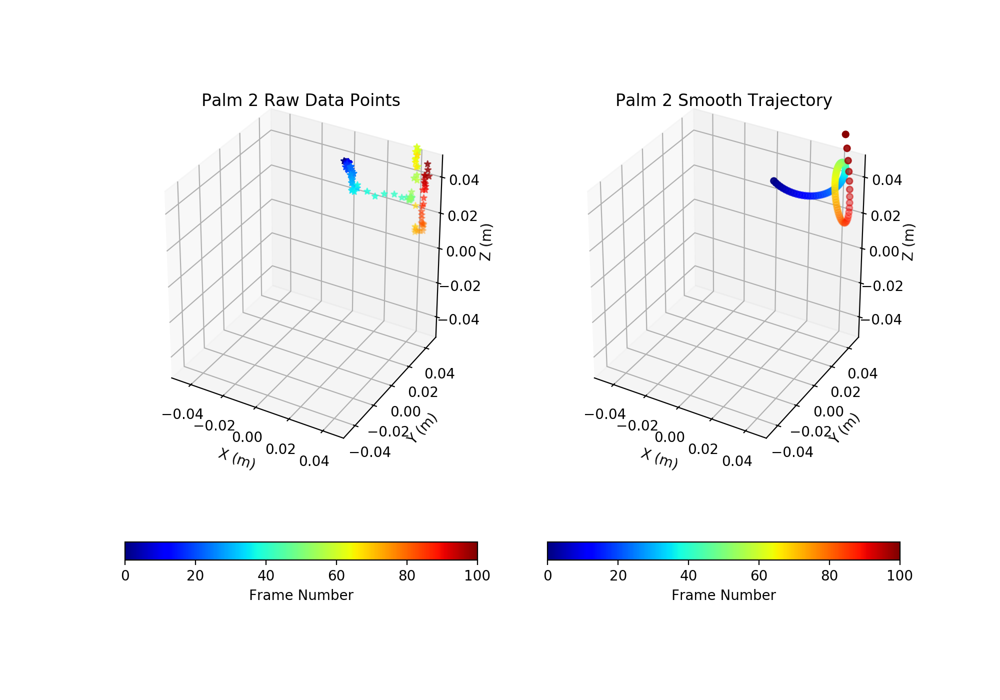

In [126]:
cm = plt.cm.get_cmap('jet')
c = range(len(y1))
fig9 = pyplot.figure()
fig9.set_figheight(7)
fig9.set_figwidth(10)

ax = fig9.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 2 Raw Data Points')

p = ax.scatter(x9, y9, z9, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
cbar = fig9.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig9.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine9, y_fine9, z_fine9, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
cbar = fig9.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm 2 Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


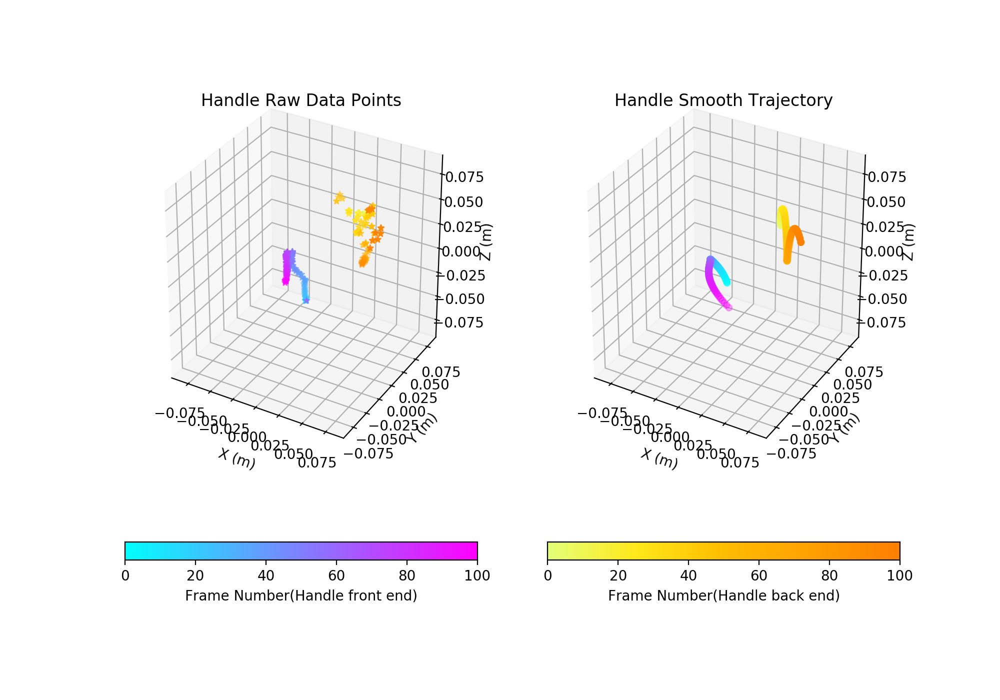

In [127]:
cm1 = plt.cm.get_cmap('cool')
c = range(len(y1))
cm2 = plt.cm.get_cmap('Wistia')

fig10 = pyplot.figure()
fig10.set_figheight(7)
fig10.set_figwidth(10)

ax = fig10.add_subplot(1, 2, 1, projection='3d')
ax.set_xlim3d([-0.09, 0.09])
ax.set_ylim3d([-0.09, 0.09])
ax.set_zlim3d([-0.09, 0.09])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Raw Data Points')

p1 = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm1, marker = '*')
p2 = ax.scatter(x2, y2, z2, c = c,vmin=0, vmax=100,cmap=cm2, marker = '*')

cbar = fig10.colorbar(p1, orientation = 'horizontal')
cbar.set_label('Frame Number(Handle front end)')

ax = fig10.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine1, y_fine1, z_fine1, c = c,vmin=0, vmax=100,cmap=cm1, marker = 'o')
ax.scatter(x_fine2, y_fine2, z_fine2, c = c,vmin=0, vmax=100,cmap=cm2, marker = 'o')

cbar = fig10.colorbar(p2, orientation = 'horizontal')
cbar.set_label('Frame Number(Handle back end)')

ax.set_xlim3d([-0.09, 0.09])
ax.set_ylim3d([-0.09, 0.09])
ax.set_zlim3d([-0.09, 0.09])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


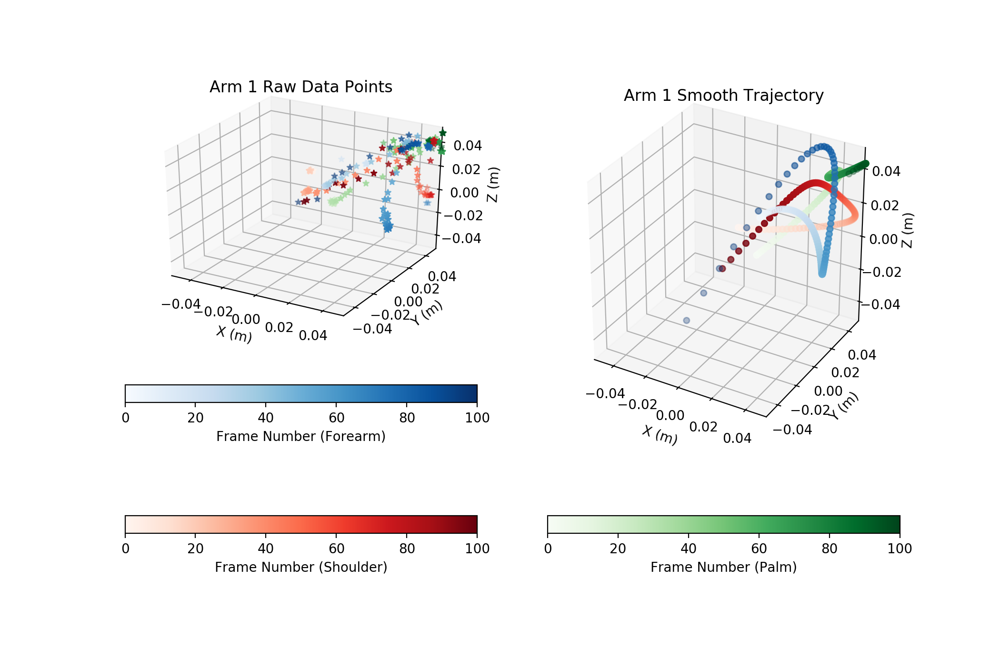

In [71]:
cm1 = plt.cm.get_cmap('Reds')
c = range(len(y1))
cm2 = plt.cm.get_cmap('Blues')
cm3 = plt.cm.get_cmap('Greens')

fig11 = pyplot.figure()
fig11.set_figheight(7)
fig11.set_figwidth(10.5)

ax = fig11.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Arm 1 Raw Data Points')

p1 = ax.scatter(x4, y4, z4, c = c,vmin=0, vmax=100,cmap=cm1, marker = '*')
p2 = ax.scatter(x5, y5, z5, c = c,vmin=0, vmax=100,cmap=cm2, marker = '*')
p3 = ax.scatter(x6, y6, z6, c = c,vmin=0, vmax=100,cmap=cm3, marker = '*')

cbar = fig11.colorbar(p1, orientation = 'horizontal')
cbar.set_label('Frame Number (Shoulder)')
cbar = fig11.colorbar(p2, orientation = 'horizontal')
cbar.set_label('Frame Number (Forearm)')

ax = fig11.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine4, y_fine4, z_fine4, c = c,vmin=0, vmax=100,cmap=cm1, marker = 'o')
ax.scatter(x_fine5, y_fine5, z_fine5, c = c,vmin=0, vmax=100,cmap=cm2, marker = 'o')
ax.scatter(x_fine6, y_fine6, z_fine6, c = c,vmin=0, vmax=100,cmap=cm3, marker = 'o')

cbar = fig11.colorbar(p3, orientation = 'horizontal')

cbar.set_label('Frame Number (Palm)')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Arm 1 Smooth Trajectory')

pyplot.show()

<IPython.core.display.Javascript object>


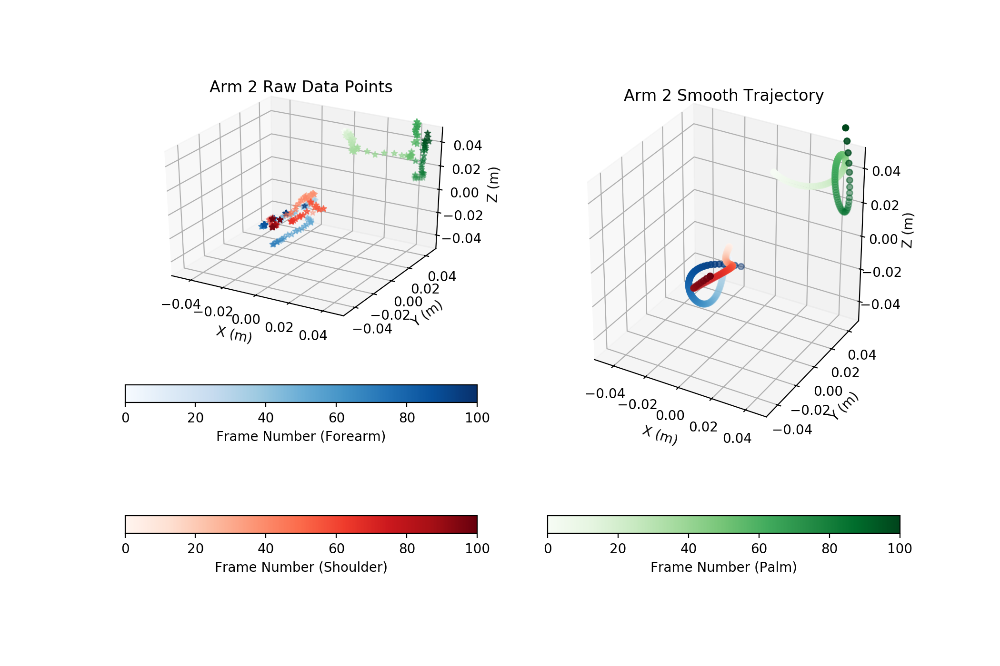

In [128]:
cm1 = plt.cm.get_cmap('Reds')
c = range(len(y1))
cm2 = plt.cm.get_cmap('Blues')
cm3 = plt.cm.get_cmap('Greens')

fig12 = pyplot.figure()
fig12.set_figheight(7)
fig12.set_figwidth(10.5)

ax = fig12.add_subplot(1, 2, 1, projection='3d')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Arm 2 Raw Data Points')

p1 = ax.scatter(x7, y7, z7, c = c,vmin=0, vmax=100,cmap=cm1, marker = '*')
p3 = ax.scatter(x9, y9, z9, c = c,vmin=0, vmax=100,cmap=cm3, marker = '*')
c = range(len(y8))
p2 = ax.scatter(x8, y8, z8, c = c,vmin=0, vmax=100,cmap=cm2, marker = '*')
c = range(len(y1))

cbar = fig12.colorbar(p1, orientation = 'horizontal')
cbar.set_label('Frame Number (Shoulder)')
cbar = fig12.colorbar(p2, orientation = 'horizontal')
cbar.set_label('Frame Number (Forearm)')

ax = fig12.add_subplot(1, 2, 2, projection='3d')
ax.scatter(x_fine7, y_fine7, z_fine7, c = c,vmin=0, vmax=100,cmap=cm1, marker = 'o')
ax.scatter(x_fine8, y_fine8, z_fine8, c = c,vmin=0, vmax=100,cmap=cm2, marker = 'o')
ax.scatter(x_fine9, y_fine9, z_fine9, c = c,vmin=0, vmax=100,cmap=cm3, marker = 'o')

cbar = fig12.colorbar(p3, orientation = 'horizontal')

cbar.set_label('Frame Number (Palm)')

ax.set_xlim3d([-0.05, 0.05])
ax.set_ylim3d([-0.05, 0.05])
ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Arm 2 Smooth Trajectory')

pyplot.show()